In [188]:
] activate .

  Activating project at `~/research/11_2024_winter/multiagent-coverage-v2`


In [199]:
] st

Status `~/research/11_2024_winter/multiagent-coverage-v2/Project.toml`
  [944b1d66] CodecZlib v0.7.6
  [a198fc80] CoverageControllers v1.0.0-DEV `https://github.com/dev10110/CoverageControllers.jl.git#main`
  [a93c6f00] DataFrames v1.6.1
  [31c24e10] Distributions v0.25.111
  [7a1cc6ca] FFTW v1.8.0
  [5789e2e9] FileIO v1.16.3
  [08572546] FlameGraphs v1.0.0
  [f6369f11] ForwardDiff v0.10.36
  [a98d9a8b] Interpolations v0.15.1
  [033835bb] JLD2 v0.4.53
  [2fda8390] LsqFit v0.15.0
  [30363a11] NetCDF v0.12.0
  [91a5bcdd] Plots v1.40.8
  [132c30aa] ProfileSVG v0.2.2
  [92933f4c] ProgressMeter v1.10.2
  [3cdcf5f2] RecipesBase v1.3.4
  [73b3b457] SpatiotemporalGPs v1.0.1-DEV `https://github.com/dev10110/SpatiotemporalGPs.jl#main`
  [90137ffa] StaticArrays v1.9.7
  [2913bbd2] StatsBase v0.34.3
  [f3b207a7] StatsPlots v0.15.7
  [ade2ca70] Dates
  [37e2e46d] LinearAlgebra
  [de0858da] Printf


In [200]:
using ProgressMeter

In [201]:
using Revise

using Plots, DataFrames, ForwardDiff, StaticArrays

using LinearAlgebra, StatsBase


# First, we load the data

In [202]:
include("src/env_data.jl")

Main.EnvData

In [203]:
fn = EnvData.get_filename(1,1) # for month 1, day 1

windData = EnvData.load_data(fn, counts=[128, 64, -1]) # load only parts of the data

Main.EnvData.WindData{Vector{Float64}, Array{Float64, 3}, Interpolations.Extrapolation{Float64, 3, Interpolations.GriddedInterpolation{Float64, 3, Array{Float64, 3}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Interpolations.Throw{Nothing}}}([458.04998779296875, 458.1499938964844, 458.25, 458.3500061035156, 458.45001220703125, 458.54998779296875, 458.6499938964844, 458.75, 458.8500061035156, 458.95001220703125  …  469.8500061035156, 469.95001220703125, 470.04998779296875, 470.1499938964844, 470.25, 470.3500061035156, 470.45001220703125, 470.54998779296875, 470.6499938964844, 470.75], [5269.75, 5269.85009765625, 5269.9501953125, 5270.0498046875, 5270.14990234375, 5270.25, 5270.35009765625, 5270.4501953125, 5270.5498046875, 5270.64990234375  …  5275.14990234375, 5275.25, 5275.35009765625, 527

In [204]:
size(windData.WX)

(128, 64, 48)

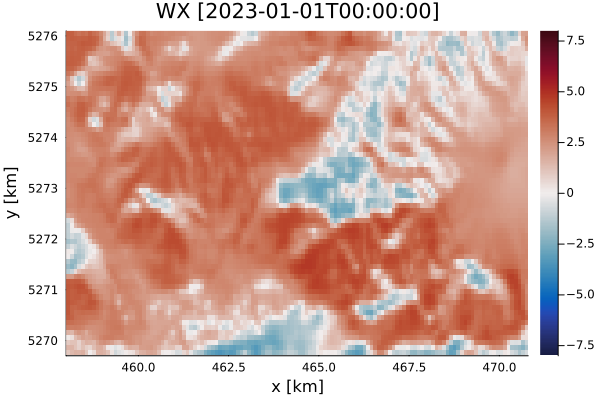

In [205]:
heatmap(windData, 1; plottype=:wx)

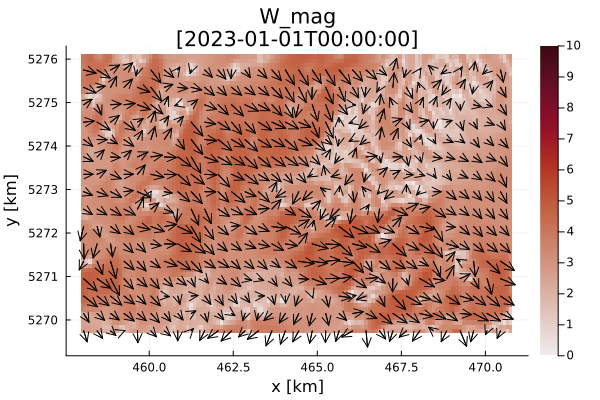

In [206]:
quiver_ax_xs = windData.X[1:4:end]
quiver_ax_ys = windData.Y[1:4:end]

quiver_xs = zeros(length(quiver_ax_xs), length(quiver_ax_ys))
quiver_ys = zeros(length(quiver_ax_xs), length(quiver_ax_ys))
for i=1:length(quiver_ax_xs)
    for j=1:length(quiver_ax_ys)
        quiver_xs[i, j] = quiver_ax_xs[i]
        quiver_ys[i, j] = quiver_ax_ys[j]
    end
end

quiver_wx = windData.WX[1:4:end, 1:4:end, 1]
quiver_wy = windData.WY[1:4:end, 1:4:end, 1]

gr()
heatmap(windData, 1; plottype=:mag, clims=(0, 10))
quiver!(vec(quiver_xs), vec(quiver_ys), quiver=(0.1*vec(quiver_wx), 0.1*vec(quiver_wy)), color=:black)

In [207]:
# savefig("wind_mag_dir.svg")

In [208]:
function urand(m, M)
    return (M - m) * rand() + m
end

urand (generic function with 1 method)

In [209]:
using SpatiotemporalGPs

In [210]:
# use values found in variograms.ipynb
σt = 1.0
σs = 2.114593506953788
lt = 182.869577978737
ls = 1.609459640726444

kt = Matern(1/2, σt, lt)
ks = Matern(1/2, σs, ls)

SpatiotemporalGPs.STGPKF.Matern12{Float64}(4.47150569965112, 0.6213265463113079)

## Create Basic Ergodic Controller

In [211]:
using CoverageControllers

using SpatiotemporalGPs

In [212]:
include("src/simulator.jl")

Main.Simulator

In [214]:
# define the robots 
N_robots = 3
x0s = [
    (urand(extrema(windData.X)...), urand(extrema(windData.Y)...))
    for i=1:N_robots
    ]

x0s = [
     (459.5329760087832, 5273.73694856282),
 (470.62220902779313, 5274.541273470303),
 (465.3656791797487, 5274.681025845158),
 # (466.6861112370844, 5271.798905628846),
 # (462.26280513554974, 5269.8380225897945),
 # (470.6370349534678, 5275.967821904445),
 # (459.1691863935661, 5270.907951838523),
 # (463.1027290274699, 5270.027307751891),
 # (470.54489124631135, 5272.64708017848),
 # (461.8104500854597, 5273.59720726287)
    ]

3-element Vector{Tuple{Float64, Float64}}:
 (459.5329760087832, 5273.73694856282)
 (470.62220902779313, 5274.541273470303)
 (465.3656791797487, 5274.681025845158)

In [215]:
# define a controller
function ergodic_controllers(
        t,                      # current time
        xs;                     # robot states
        coverage_grid,          # grid used in ergodic
        coverage_q_map,         # 2D map of clarity
        traj_history,           # history of positions
        robot_model,            # robot model
        kwargs...
        )

    # construct the TSD
    tsd = ones(size(coverage_q_map));

    # compute the control inputs
    us = [
        CoverageControllers.ergodic_controller(coverage_grid, robot_model, x, tsd, traj_history; 
            boundary_correction_distance = 0.75)
            for x in xs]
    
    return us
end

ergodic_controllers (generic function with 1 method)

In [216]:
# define the simulation parameters

# max speed of robots in m/s
umax_m_per_s = 15.0 # m/s

# take a measurement every
sim_ΔT = (5.0 / 60.0) # minutues
stgpkf_ΔT = (5.0 / 60.) # minutes
sim_T_end = 2 * 60.0 # $ 1.0 * 60.0 # minutes

σ_meas = 0.5 # m/s

# create the grids
coverage_grid_Δx = (diff([extrema(windData.X)...]) / 40)[1]
coverage_grid_Δy = (diff([extrema(windData.Y)...]) / 40)[1]

0.1574951171875

In [250]:
coverage_grid_Δx, coverage_grid_Δy

(0.31750030517578126, 0.1574951171875)

In [217]:
# compute extra things
umax = umax_m_per_s * 60.0 / 1000.0 # km/min = 30 m/s = 60 kts = 1.8 km/min 
robot_model = SingleIntegrator(umax)

# simulation times
sim_ts = 0.0:(sim_ΔT):(sim_T_end)

# define the coverage grid
sim_xs = range(extrema(windData.X)..., step=coverage_grid_Δx)
sim_ys = range(extrema(windData.Y)..., step=coverage_grid_Δy)

# since this uses the same grid, we can simply reshape
coverage_grid = CoverageControllers.Grid(
    (sim_xs[1], sim_ys[1]), 
    (step(sim_xs), step(sim_ys)),
    (length(sim_xs), length(sim_ys))) 

grid_points = vec([@SVector[x, y] for x in sim_xs, y in sim_ys]);
stgpkf_problem = STGPKFProblem(grid_points, ks, kt, stgpkf_ΔT)

STGPKFProblem{SVector{2, Float64}, Float64, Vector{SVector{2, Float64}}, SpatiotemporalGPs.STGPKF.Matern12{Float64}, SpatiotemporalGPs.STGPKF.Matern12{Float64}, SpatiotemporalGPs.STGPKF.DiscreteTimeStateSpaceModel{SMatrix{1, 1, Float64, 1}, SMatrix{1, 1, Float64, 1}, SMatrix{1, 1, Float64, 1}, Float64}, Symmetric{Float64, Matrix{Float64}}, Symmetric{Float64, Matrix{Float64}}}(SVector{2, Float64}[[458.04998779296875, 5269.75], [458.3674880981445, 5269.75], [458.6849884033203, 5269.75], [459.0024887084961, 5269.75], [459.3199890136719, 5269.75], [459.63748931884766, 5269.75], [459.9549896240234, 5269.75], [460.2724899291992, 5269.75], [460.589990234375, 5269.75], [460.9074905395508, 5269.75]  …  [467.89249725341796, 5276.0498046875], [468.2099975585937, 5276.0498046875], [468.52749786376955, 5276.0498046875], [468.8449981689453, 5276.0498046875], [469.1624984741211, 5276.0498046875], [469.47999877929686, 5276.0498046875], [469.79749908447263, 5276.0498046875], [470.11499938964846, 5276.0

In [218]:
v=0
filepath = "results_ergo_$(v).jld2"
while isfile(filepath)
    v+=1
    filepath = "results_ergo_$(v).jld2"
end

In [219]:
filepath

"results_ergo_0.jld2"

In [220]:
# # run the simulation

if false
@time Simulator.simulate(
    sim_ts, 
    x0s,
    ergodic_controllers,
    windData, 
    coverage_grid, 
    stgpkf_problem,
    robot_model,
    filepath;
    σ_meas = σ_meas
    )
end

In [221]:
Simulator.visualize_results(60.0, filepath, windData)

LoadError: ArgumentError: No file exists at given path: results_ergo_0.jld2

In [222]:
@gif for t = range(extrema(sim_ts)..., length=60)
    Simulator.visualize_results(t, filepath, windData)
end

LoadError: ArgumentError: No file exists at given path: results_ergo_0.jld2

In [223]:
plot()
Simulator.plot_trajectories!(filepath; label=false)
for boundary in CoverageControllers.GridBoundary(coverage_grid)
    plot!(boundary, dist=0.75)
end
plot!()

LoadError: ArgumentError: No file exists at given path: results_ergo_0.jld2

In [224]:
# @gif for ti = Int.(round.(range(1, length(res_ergo.wx_qs), length=60)))
#     histogram(vec(res_ergo.wx_qs[ti]), normalize=:pdf, xlims=(0, 1), ylims=(0, 5), bins=range(0, 1, length=25))
# end

## Create and simulate the direct method

In [225]:
include("src/clarity_dynamics.jl")

Main.ClarityDynamics

In [226]:
module DirectMethod

using ForwardDiff, StaticArrays, LinearAlgebra
using CoverageControllers

using Plots

# this is a direction vector for single-integrator control
function descent_direction(grid::CoverageControllers.Grid{2}, x, target_clarity, current_clarity, Sfun)

    # check dimensions
    size(target_clarity) == grid.N || throw(DimensionMismatch())
    size(current_clarity) == grid.N || throw(DimensionMismatch())

    N1, N2 = grid.N

    # define the derivative wrt x
    function DxS(p, x)
        sp = SVector{2}(p...)
        sx = SVector{2}(x...)
        dxs = ForwardDiff.gradient(xx -> Sfun(sp, xx), sx)
        return dxs
    end

    Bx = zeros(N1, N2)
    By = zeros(N1, N2)
    for i = 1:N1, j = 1:N2
        p = CoverageControllers.ind2pos(grid, CartesianIndex(i, j))
        q = current_clarity[i, j]
        Dx1S, Dx2S = DxS(p, x)
        Bx[i, j] = (1 - q)^2 * Dx1S
        By[i, j] = (1 - q)^2 * Dx2S
    end

    # compute Bhat
    Bxhat = CoverageControllers.dct_map(grid, Bx, normalize=false)
    Byhat = CoverageControllers.dct_map(grid, By, normalize=false)

    # compute the clarity 
    target_minus_current_clarity = target_clarity - current_clarity
    
    dct_target_minus_current = CoverageControllers.dct_map(grid, target_minus_current_clarity, normalize=false)

    # compute the Lk
    Lx = 0
    Ly = 0
    for i = 1:N1, j = 1:N2
        k1 = (i - 1)
        k2 = (j - 1)
        s = CoverageControllers.Λ2D(k1, k2) * dct_target_minus_current[i, j]
        Lx += s * Bxhat[i, j]
        Ly += s * Byhat[i, j]
    end

    return (-Lx, -Ly)
end


function direct_controller(
        grid::CoverageControllers.Grid{2},
        robot::CoverageControllers.SingleIntegrator,
        robot_state, 
        target_clarity,
        current_clarity,
        Sfun;
        boundaries = CoverageControllers.GridBoundary(grid),
        boundary_correction_distance=0)

    # for a single integrator, the state is the position
    pos = CoverageControllers.position(robot, robot_state)

    # get the descent direction
    b = descent_direction(grid, pos, target_clarity, current_clarity, Sfun)

    # get the control input
    u = - robot.umax .* normalize(b)

    # do a boundary correction
    if (boundary_correction_distance > 0)
        u = CoverageControllers.avoid_boundaries(robot, robot_state, u, boundaries; max_dist = boundary_correction_distance)
    end
    
    return u

end


end


# now define the full set of direct controllers
function direct_controllers(
        t, 
        xs; 
        coverage_grid,
        coverage_q_map,
        robot_model, 
        kwargs...
        )

    target_clarity = 0.7 * ones(coverage_grid.N)
        
    u = [
        DirectMethod.direct_controller(
            coverage_grid,
            robot_model,
            xi, 
            target_clarity,
            coverage_q_map,
            sensitivity_function;
            boundary_correction_distance=0.25)
        for xi in xs]

    return u
end

direct_controllers (generic function with 1 method)

In [227]:
sensitivity_function = ClarityDynamics.create_sensitivity_function(ks, sim_ΔT, σ_meas)

(::Main.ClarityDynamics.var"#sfunc#1"{SpatiotemporalGPs.STGPKF.Matern12{Float64}, Float64, Float64}) (generic function with 1 method)

In [228]:
decay_function = ClarityDynamics.create_decay_function(kt)

(::Main.ClarityDynamics.var"#wfunc#2"{Float64, Float64}) (generic function with 1 method)

In [229]:
@show sensitivity_function(0,0)
@show sensitivity_function(0,2.)

sensitivity_function(0, 0) = 214.63227358325383
sensitivity_function(0, 2.0) = 1.02775112729476


1.02775112729476

In [230]:
@show decay_function(0,0)
@show decay_function(0,1.0)

decay_function(0, 0) = -0.0
decay_function(0, 1.0) = 0.010936756250580664


0.010936756250580664

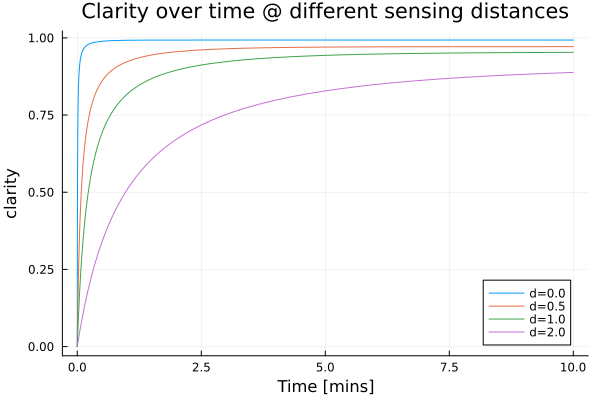

In [231]:
plot()
for d=[0.0, 0.5, 1.0, 2.0]
    plot!(t-> ClarityDynamics.clarity_solution(t, 0.0, ks, kt,sim_ΔT, σ_meas, d), 0, 10.0, label="d=$d")
end
plot!(title="Clarity over time @ different sensing distances", xlabel="Time [mins]", ylabel="clarity")
plot!()

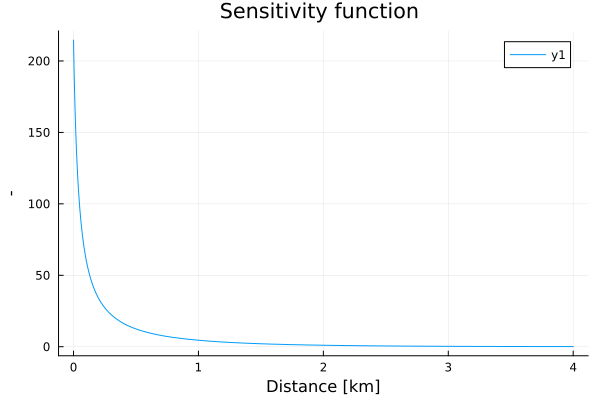

In [232]:
plot()
plot!(d-> sensitivity_function(0, d), 0, 4.0)
plot!(title="Sensitivity function ", xlabel="Distance [km]", ylabel="-")
plot!()

In [233]:
v=0
filepath_direct = "results_direct_$(v).jld2"
while isfile(filepath_direct)
    v+=1
    filepath_direct = "results_direct_$(v).jld2"
end

In [234]:
filepath_direct

"results_direct_0.jld2"

In [235]:
# run the simulation
@time Simulator.simulate(
    sim_ts, 
    x0s,
    direct_controllers,
    windData, 
    coverage_grid, 
    stgpkf_problem,
    robot_model,
    filepath_direct
    ;
    σ_meas = σ_meas
    );

Progress: 100%|█████████████████████████████████████████| Time: 0:40:00


2406.301117 seconds (30.80 M allocations: 493.743 GiB, 4.69% gc time)


In [236]:
# filepath_direct = "results_direct_1.jld2"

In [237]:
Simulator.read_result_file(filepath_direct, "setup/ts")

0.0:0.08333333333333333:120.0

In [238]:
Simulator.visualize_results(Simulator.read_result_file(filepath_direct, "setup/ts")[end], filepath_direct, windData, stgpkf_problem, coverage_grid)

LoadError: MethodError: no method matching visualize_results(::Float64, ::String, ::Main.EnvData.WindData{Vector{Float64}, Array{Float64, 3}, Interpolations.Extrapolation{Float64, 3, Interpolations.GriddedInterpolation{Float64, 3, Array{Float64, 3}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Interpolations.Throw{Nothing}}}, ::STGPKFProblem{SVector{2, Float64}, Float64, Vector{SVector{2, Float64}}, SpatiotemporalGPs.STGPKF.Matern12{Float64}, SpatiotemporalGPs.STGPKF.Matern12{Float64}, SpatiotemporalGPs.STGPKF.DiscreteTimeStateSpaceModel{SMatrix{1, 1, Float64, 1}, SMatrix{1, 1, Float64, 1}, SMatrix{1, 1, Float64, 1}, Float64}, Symmetric{Float64, Matrix{Float64}}, Symmetric{Float64, Matrix{Float64}}}, ::Grid{2, Float64, FFTW.r2rFFTWPlan{Float64, Vector{Int32}, false, 2, Tuple{Int64, Int64}}})

[0mClosest candidates are:
[0m  visualize_results(::Any, ::Any, ::Any)
[0m[90m   @[39m [35mMain.Simulator[39m [90m~/research/11_2024_winter/multiagent-coverage-v2/src/[39m[90m[4msimulator.jl:332[24m[39m


In [239]:
@gif for t = range(extrema(Simulator.read_result_file(filepath_direct, "setup/ts"))..., length=60)
    Simulator.visualize_results(t, filepath_direct, windData, stgpkf_problem, coverage_grid)
end

LoadError: MethodError: no method matching visualize_results(::Float64, ::String, ::Main.EnvData.WindData{Vector{Float64}, Array{Float64, 3}, Interpolations.Extrapolation{Float64, 3, Interpolations.GriddedInterpolation{Float64, 3, Array{Float64, 3}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Interpolations.Throw{Nothing}}}, ::STGPKFProblem{SVector{2, Float64}, Float64, Vector{SVector{2, Float64}}, SpatiotemporalGPs.STGPKF.Matern12{Float64}, SpatiotemporalGPs.STGPKF.Matern12{Float64}, SpatiotemporalGPs.STGPKF.DiscreteTimeStateSpaceModel{SMatrix{1, 1, Float64, 1}, SMatrix{1, 1, Float64, 1}, SMatrix{1, 1, Float64, 1}, Float64}, Symmetric{Float64, Matrix{Float64}}, Symmetric{Float64, Matrix{Float64}}}, ::Grid{2, Float64, FFTW.r2rFFTWPlan{Float64, Vector{Int32}, false, 2, Tuple{Int64, Int64}}})

[0mClosest candidates are:
[0m  visualize_results(::Any, ::Any, ::Any)
[0m[90m   @[39m [35mMain.Simulator[39m [90m~/research/11_2024_winter/multiagent-coverage-v2/src/[39m[90m[4msimulator.jl:332[24m[39m


Progress: 100%|█████████████████████████████████████████| Time: 0:00:09


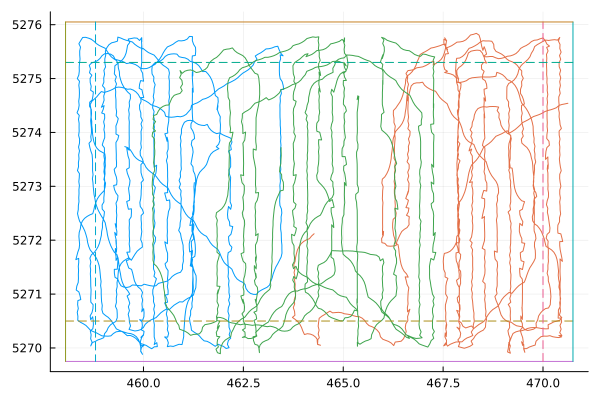

In [240]:
plot()
Simulator.plot_trajectories!(filepath_direct; label=false)
for boundary in CoverageControllers.GridBoundary(coverage_grid)
    plot!(boundary, dist=0.75)
end
plot!()

## Indirect Method

In [241]:
function indirect_controllers(
        t, 
        xs; 
        coverage_grid,
        coverage_q_map,
        traj_history,
        robot_model, 
        kwargs...
        )

    
    qtarget = 0.7

    # determine the desired spatial target distribution
    target_spatial_dist = zeros(size(coverage_q_map))

    α, β, γ = ClarityDynamics.get_ricatti_coeffs(ks, kt, sim_ΔT, σ_meas, 0.0)

    tsd = map(q0 -> ClarityDynamics.inverse_ricatti_solution(q0, qtarget, α, β, γ), coverage_q_map)


    us = [
        CoverageControllers.ergodic_controller(coverage_grid, robot_model, x, tsd, traj_history; 
            boundary_correction_distance = 0.75)
            for x in xs]
    
    return us

end

indirect_controllers (generic function with 1 method)

In [242]:
v=0
filepath_indirect = "results_indirect_$(v).jld2"
while isfile(filepath_indirect)
    v+=1
    filepath_indirect = "results_indirect_$(v).jld2"
end

In [243]:
# run the simulation
@time Simulator.simulate(
    sim_ts, 
    x0s,
    indirect_controllers,
    windData, 
    coverage_grid, 
    stgpkf_problem,
    robot_model,
    filepath_indirect;
    σ_meas = σ_meas
    );

Progress: 100%|█████████████████████████████████████████| Time: 0:38:28


2313.239817 seconds (29.81 M allocations: 493.572 GiB, 4.77% gc time)


In [244]:
filepath_indirect

"results_indirect_0.jld2"

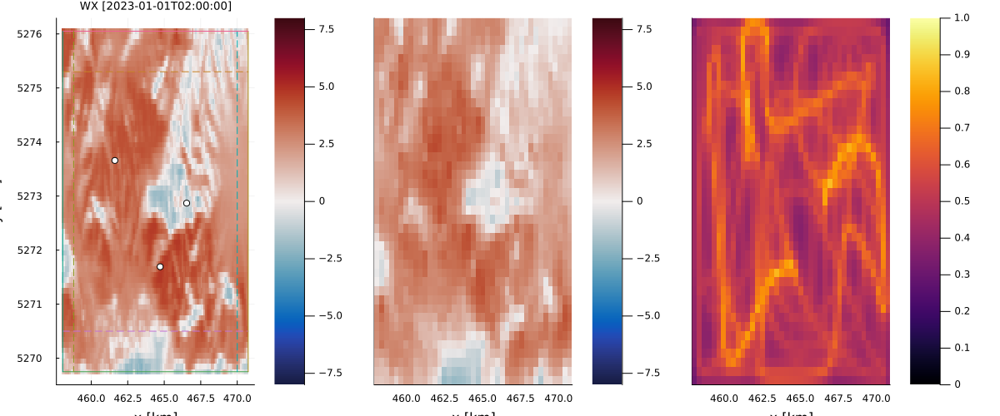

In [245]:
Simulator.visualize_results(Simulator.read_result_file(filepath_indirect, "setup/ts")[end], filepath_indirect, windData)

In [246]:
# histogram(vec(res_indirect.wx_qs[end]))

[ Info: Saved animation to /Users/devanshagrawal/research/11_2024_winter/multiagent-coverage-v2/tmp.gif


Plots.AnimatedGif("/Users/devanshagrawal/research/11_2024_winter/multiagent-coverage-v2/tmp.gif")
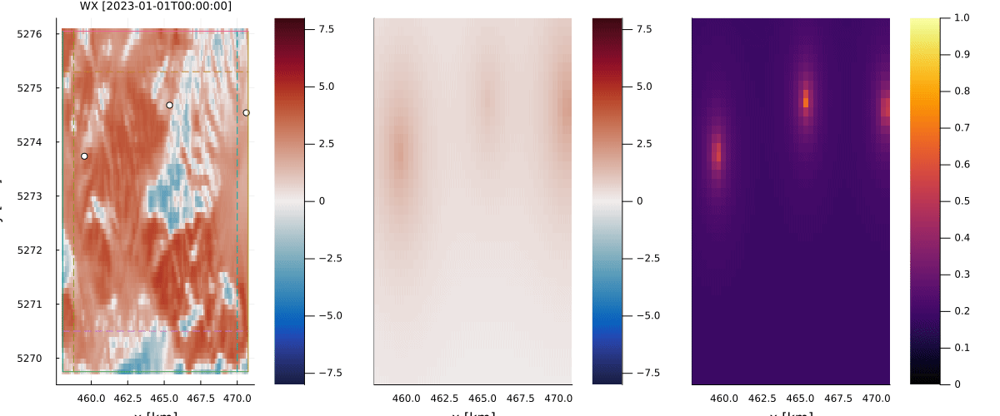

In [247]:
@gif for t = range(extrema(Simulator.read_result_file(filepath_indirect, "setup/ts"))..., length=60)
    Simulator.visualize_results(t, filepath_indirect, windData)
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:09


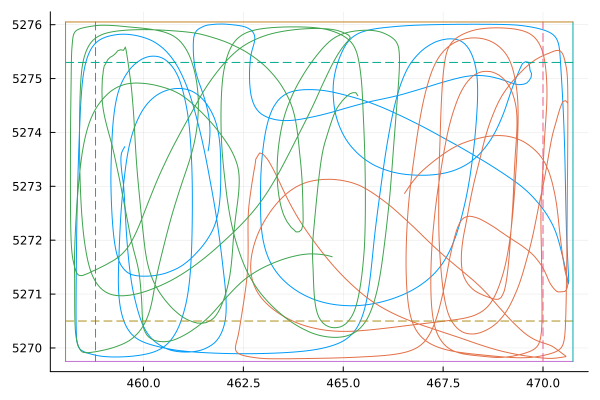

In [248]:
plot()
Simulator.plot_trajectories!(filepath_indirect; label=false)
for boundary in CoverageControllers.GridBoundary(coverage_grid)
    plot!(boundary, dist=0.75)
end
plot!()